## Import needed libraries

In [ ]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from tensorflow.keras.utils import plot_model

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.applications import InceptionV3

print ('modules loaded')

modules loaded


## Data Preprocessing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Load data

In [ ]:
tr_df_path="/content/drive/MyDrive/dataset/archive/Training"
labels=[]
filepaths=[]

folds=os.listdir(tr_df_path)
for fold in folds:
    foldpath=os.path.join(tr_df_path,fold)
    foldlist=os.listdir(foldpath)
    for file in foldlist:
        filepath=os.path.join(foldpath,file)

        labels.append(fold)
        filepaths.append(filepath)


l=pd.Series(labels,name="labels")
f=pd.Series(filepaths,name="filepaths")

tr_df=pd.concat([f,l],axis=1)

In [ ]:
tr_df

,filepaths,labels
0,/content/drive/MyDrive/dataset/archive/Trainin...,pituitary
1,/content/drive/MyDrive/dataset/archive/Trainin...,pituitary
2,/content/drive/MyDrive/dataset/archive/Trainin...,pituitary
3,/content/drive/MyDrive/dataset/archive/Trainin...,pituitary
4,/content/drive/MyDrive/dataset/archive/Trainin...,pituitary
...,...,...
5707,/content/drive/MyDrive/dataset/archive/Trainin...,meningioma
5708,/content/drive/MyDrive/dataset/archive/Trainin...,meningioma
5709,/content/drive/MyDrive/dataset/archive/Trainin...,meningioma
5710,/content/drive/MyDrive/dataset/archive/Trainin...,meningioma


In [ ]:
tst_df_path="/content/drive/MyDrive/dataset/archive/Testing"
labels=[]
filepaths=[]

folds=os.listdir(tst_df_path)
for fold in folds:
    foldpath=os.path.join(tst_df_path,fold)
    foldlist=os.listdir(foldpath)
    for file in foldlist:
        filepath=os.path.join(foldpath,file)

        labels.append(fold)
        filepaths.append(filepath)

l=pd.Series(labels,name="labels")
f=pd.Series(filepaths,name="filepaths")

ts_df=pd.concat([f,l],axis=1)

In [ ]:
ts_df

,filepaths,labels
0,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
1,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
2,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
3,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
4,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
...,...,...
1306,/content/drive/MyDrive/dataset/archive/Testing...,pituitary
1307,/content/drive/MyDrive/dataset/archive/Testing...,pituitary
1308,/content/drive/MyDrive/dataset/archive/Testing...,pituitary
1309,/content/drive/MyDrive/dataset/archive/Testing...,pituitary


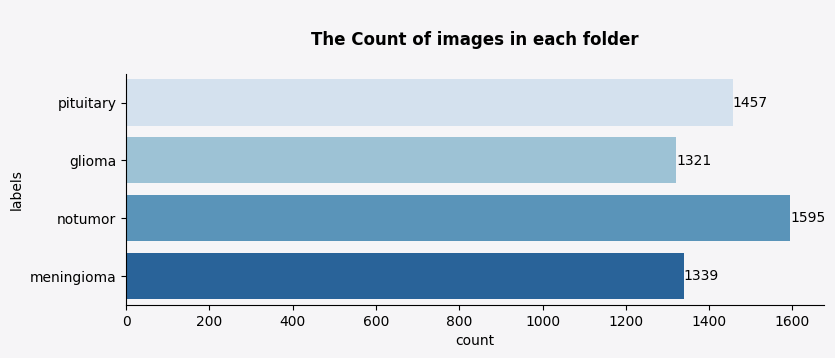

In [ ]:
fig,ax=plt.subplots(figsize=(9,3))
fig.patch.set_facecolor("#f6f5f7")
ax.set_facecolor("#f6f5f7")
for i in ["top","right"]:
    ax.spines[i].set_visible(False)

x = sns.countplot(data=tr_df, y=tr_df["labels"],palette='Blues')
for container in x.containers:
    x.bar_label(container)
plt.title("\nThe Count of images in each folder\n",weight="bold");

In [ ]:
ts_df.shape

(1311, 2)

### Split dataframe into train, valid, and test

In [ ]:
valid_df,tst_df=train_test_split(ts_df,test_size=0.5,random_state=50,stratify=ts_df["labels"])
print(f"ts_df shape: {ts_df.shape}")
print("---"*10)
print(f"valid data shape: {valid_df.shape}")
print(f"test data shape: {tst_df.shape}")

ts_df shape: (1311, 2)
------------------------------
valid data shape: (655, 2)
test data shape: (656, 2)


In [ ]:
valid_df

,filepaths,labels
324,/content/drive/MyDrive/dataset/archive/Testing...,notumor
1275,/content/drive/MyDrive/dataset/archive/Testing...,pituitary
83,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
985,/content/drive/MyDrive/dataset/archive/Testing...,glioma
508,/content/drive/MyDrive/dataset/archive/Testing...,notumor
...,...,...
303,/content/drive/MyDrive/dataset/archive/Testing...,meningioma
1143,/content/drive/MyDrive/dataset/archive/Testing...,pituitary
385,/content/drive/MyDrive/dataset/archive/Testing...,notumor
699,/content/drive/MyDrive/dataset/archive/Testing...,notumor


### Create image data generator

In [ ]:
img_size=(224,224)

tr=ImageDataGenerator()
ts=ImageDataGenerator()

train_gen=tr.flow_from_dataframe(tr_df,x_col="filepaths",y_col="labels",
                                 target_size=img_size,
                                 batch_size=16,shuffle=True,
                                 class_mode='categorical',color_mode="rgb")


valid_gen=ts.flow_from_dataframe(ts_df,x_col='filepaths',y_col='labels',
                                target_size=img_size,
                                 class_mode="categorical",color_mode="rgb",
                                 shuffle=True,batch_size=16,)


test_gen=ts.flow_from_dataframe(ts_df, x_col='filepaths', y_col='labels',
                                 target_size=img_size,
                                 batch_size=16, shuffle=False,
                                 color_mode="rgb", class_mode="categorical")

Found 5712 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.
Found 1311 validated image filenames belonging to 4 classes.


### Show sample from train data

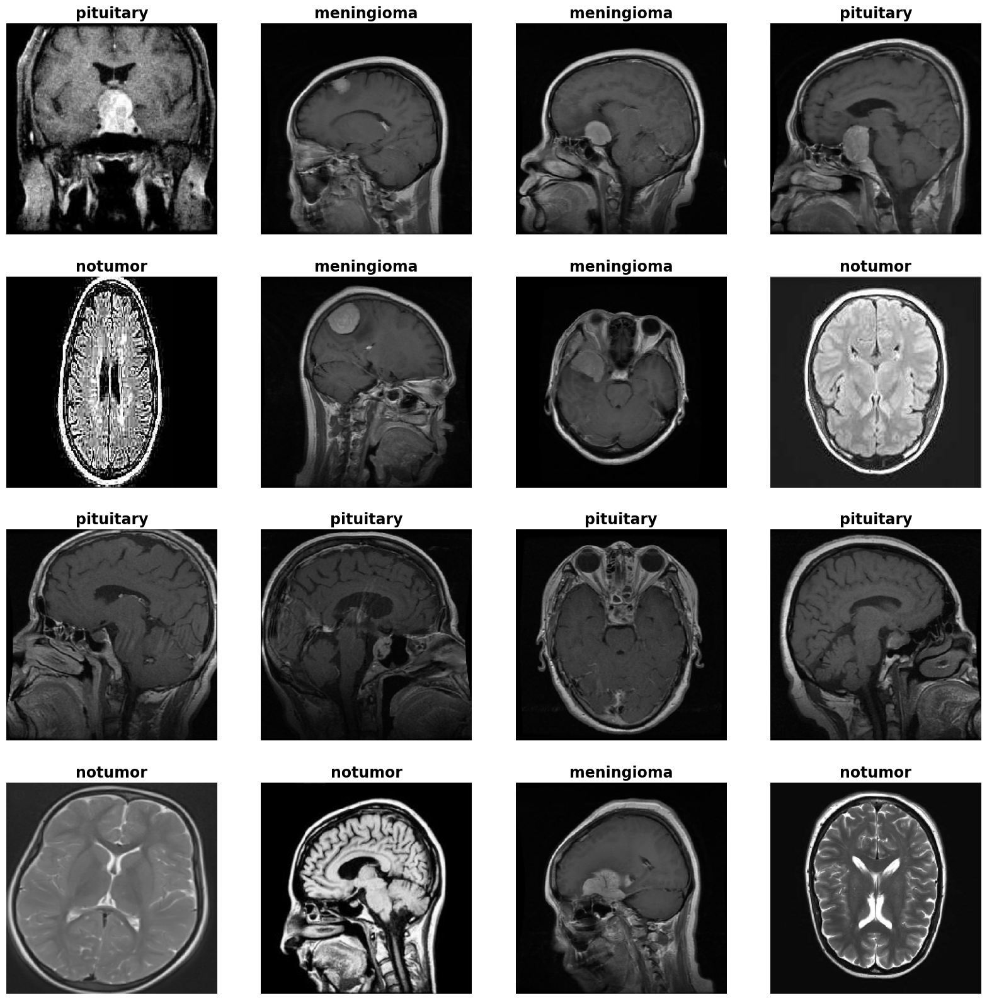

In [ ]:
gen_dict = train_gen.class_indices
classes = list(gen_dict.keys())
images , labels = next(train_gen)

plt.figure(figsize= (20,20))

for i in range(16):
    plt.subplot(4,4,i+1)
    image = images[i] / 255
    plt.imshow(image)
    index = np.argmax(labels[i])
    class_name = classes[index]
    plt.title(class_name , color = 'black' , fontsize= 17,weight="bold")
    plt.axis('off')
plt.show()

Image Translation

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

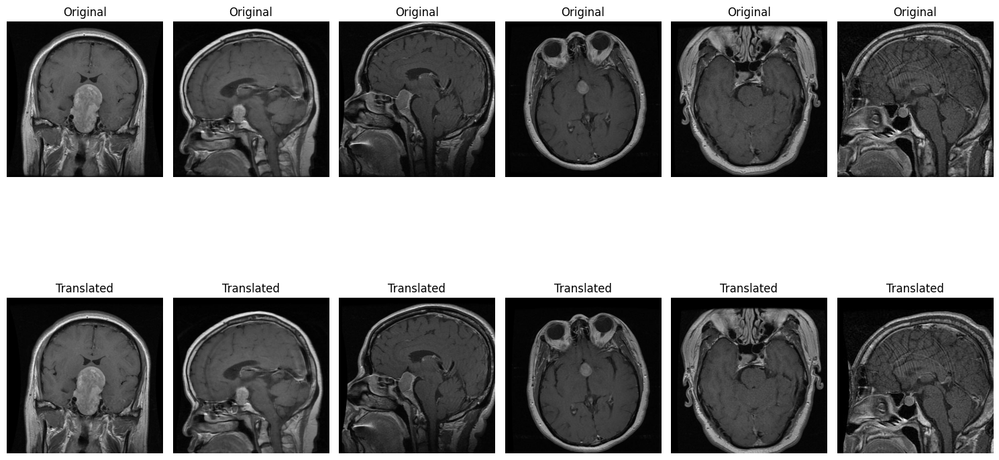

In [ ]:
def translate_image(image, x, y):
    rows, cols = image.shape[:2]
    M = np.float32([[1, 0, x], [0, 1, y]])
    translated_image = cv2.warpAffine(image, M, (cols, rows))
    return translated_image

# Load the first 12 images from the training dataset
train_images = tr_df['filepaths'].iloc[:12]

# Display original and translated images with labels
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    # Perform translation on the image
    translated_image = translate_image(image, 10, 20)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)
    plt.imshow(cv2.cvtColor(translated_image, cv2.COLOR_BGR2RGB))
    plt.title('Translated')
    plt.axis('off')

plt.tight_layout()
plt.show()


Image Rotation

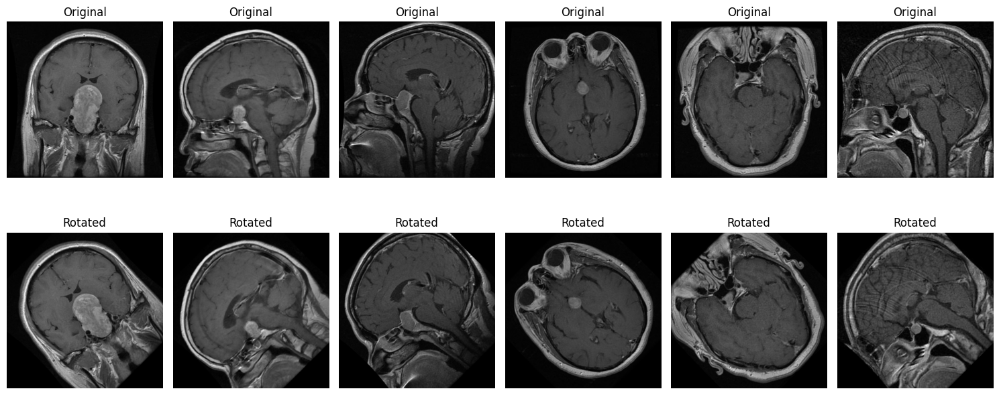

In [ ]:
def rotate_image(image, angle):
    rows, cols = image.shape[:2]
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    rotated_image = cv2.warpAffine(image, M, (cols, rows))
    return rotated_image

# Load the first 12 images from the training dataset
train_images = tr_df['filepaths'].iloc[:12]

# Display original and rotated images with labels
plt.figure(figsize=(15, 7))  # Adjusted figure size for two rows

# Display the grid of images
for i in range(6):  # Reduced the loop range for two rows
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    # Perform rotation on the image
    rotated_image = rotate_image(image, 45)  # Rotate by 45 degrees

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)  # Adjusted subplot index for the second row
    plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.title('Rotated')
    plt.axis('off')

plt.tight_layout()
plt.show()

Image shearing

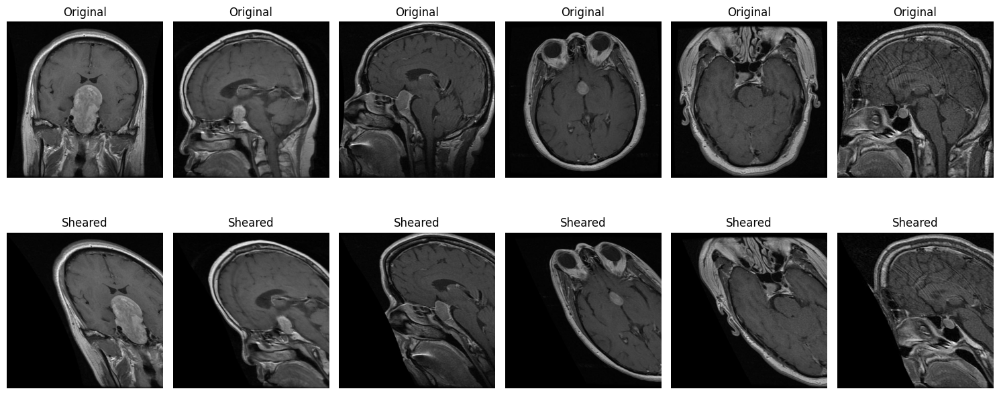

In [ ]:
def shear_image(image, shear_factor):
    rows, cols = image.shape[:2]
    M = np.float32([[1, shear_factor, 0], [0, 1, 0]])
    sheared_image = cv2.warpAffine(image, M, (cols, rows))
    return sheared_image

# Display original and sheared images with labels
plt.figure(figsize=(15, 7))  # Adjusted figure size for two rows

# Display the grid of images
for i in range(6):  # Adjusted loop for 6 images
    plt.subplot(2, 6, i + 1)  # Adjusted subplot for two rows
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)  # Adjusted subplot for two rows
    sheared_image = shear_image(image, 0.5)  # Shear by a factor of 0.5
    plt.imshow(cv2.cvtColor(sheared_image, cv2.COLOR_BGR2RGB))
    plt.title('Sheared')
    plt.axis('off')

plt.tight_layout()
plt.show()

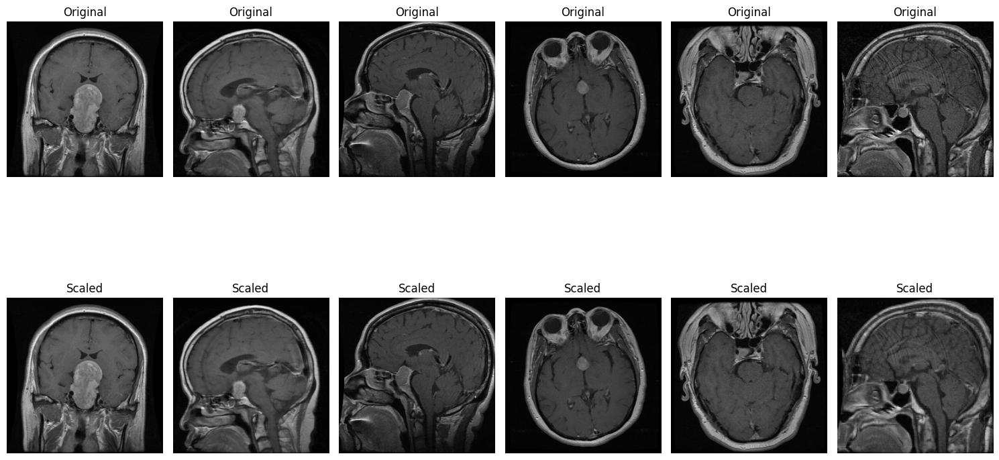

In [ ]:
def scale_image(image, scale_factor):
    scaled_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    return scaled_image

# Load an image from the training dataset
train_image_path = tr_df['filepaths'].iloc[0]  # Change index as needed
image = cv2.imread(train_image_path)

# Scale the image
scaled_image = scale_image(image, 0.5)

# Display original and scaled images with labels
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    # Plot the original image
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    # Perform scaling on the image
    scaled_image = scale_image(image, 0.5)  # Scale by a factor of 0.5

    # Plot the scaled image
    plt.subplot(2, 6, i + 7)
    plt.imshow(cv2.cvtColor(scaled_image, cv2.COLOR_BGR2RGB))
    plt.title('Scaled')
    plt.axis('off')

plt.tight_layout()
plt.show()


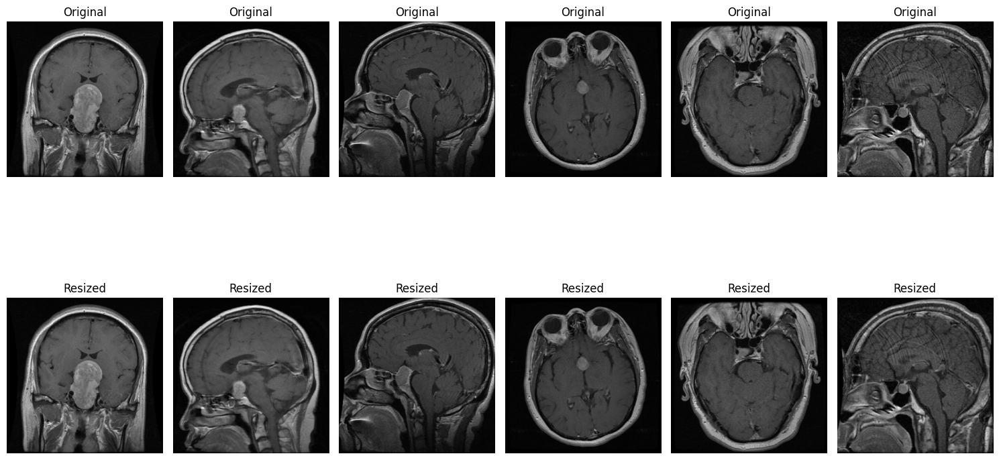

In [ ]:
def resize_image(image, width, height):
    resized_image = cv2.resize(image, (width, height), interpolation=cv2.INTER_LINEAR)
    return resized_image

# Display original and resized images with labels
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    # Perform resizing on the image
    resized_image = resize_image(image, 300, 300)  # Resize to 300x300

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.title('Resized')
    plt.axis('off')

plt.tight_layout()
plt.show()


Normalization

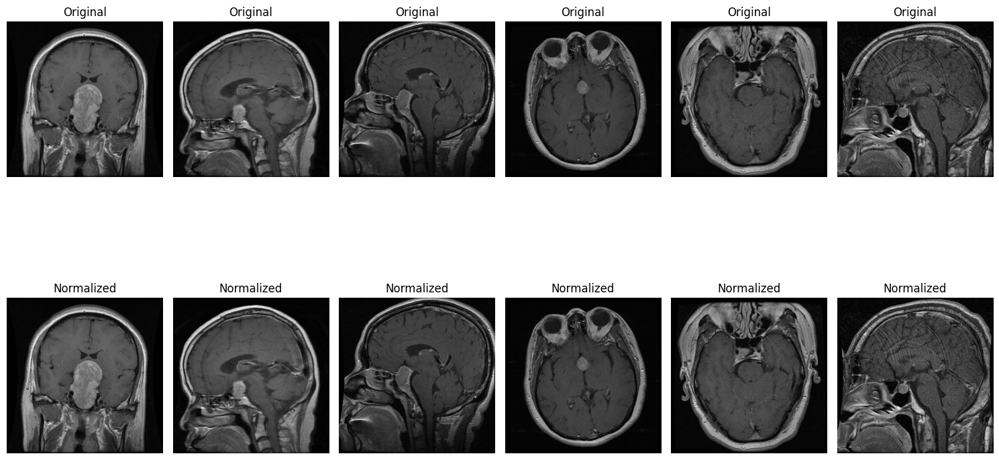

In [ ]:
def normalize_image(image):
    normalized_image = cv2.normalize(image, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return normalized_image

# Display original and normalized images with labels
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)
    normalized_image = normalize_image(image)
    plt.imshow(cv2.cvtColor(normalized_image, cv2.COLOR_BGR2RGB))
    plt.title('Normalized')
    plt.axis('off')

plt.tight_layout()
plt.show()


Histogram Equalization

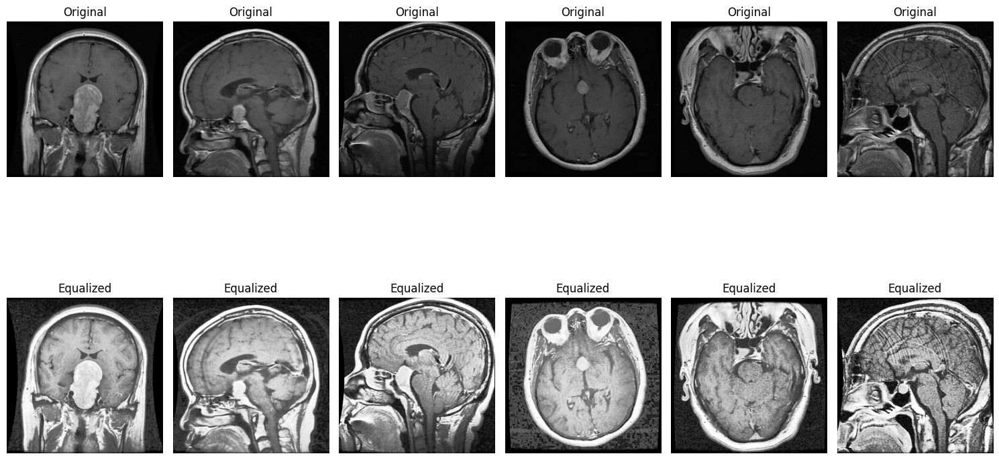

In [ ]:
def equalize_histogram(image):
    equalized_image = cv2.equalizeHist(image)
    return equalized_image

# Display original and equalized images with labels
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale for histogram equalization

    plt.imshow(image, cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)
    equalized_image = equalize_histogram(image)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Equalized')
    plt.axis('off')

plt.tight_layout()
plt.show()


Global Threshold

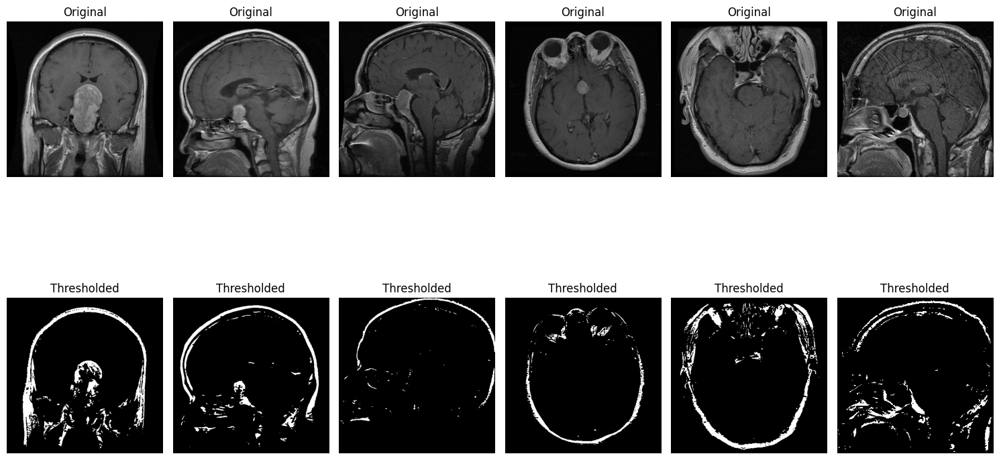

In [ ]:
def global_threshold(image, threshold_value):
    ret, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)
    return thresholded_image

# Load an image from the training dataset
train_image_path = tr_df['filepaths'].iloc[0]  # Change index as needed
image = cv2.imread(train_image_path, cv2.IMREAD_GRAYSCALE)

# Apply global thresholding
threshold_value = 127
thresholded_image = global_threshold(image, threshold_value)

plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale

    plt.imshow(image, cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, 6, i + 7)
    thresholded_image = global_threshold(image, 127)
    plt.imshow(thresholded_image, cmap='gray')
    plt.title('Thresholded')
    plt.axis('off')

plt.tight_layout()
plt.show()


Adaptive Thresholding

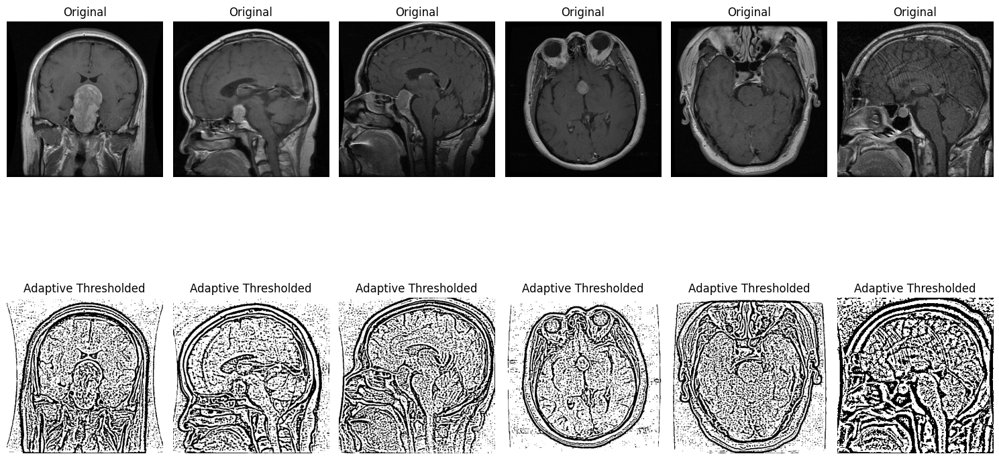

In [ ]:
def adaptive_threshold(image, max_value, adaptive_method=cv2.ADAPTIVE_THRESH_MEAN_C, threshold_type=cv2.THRESH_BINARY, block_size=11, constant=2):
    thresholded_image = cv2.adaptiveThreshold(image, max_value, adaptive_method, threshold_type, block_size, constant)
    return thresholded_image

# Example usage:
thresholded_image = adaptive_threshold(image, 255)
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale

    # Plot the original image
    plt.imshow(image, cmap='gray')
    plt.title('Original')
    plt.axis('off')

    # Perform adaptive thresholding on the image
    thresholded_image = adaptive_threshold(image, 255)

    # Plot the thresholded image
    plt.subplot(2, 6, i + 7)
    plt.imshow(thresholded_image, cmap='gray')
    plt.title('Adaptive Thresholded')
    plt.axis('off')

plt.tight_layout()
plt.show()


Edge detection - canny

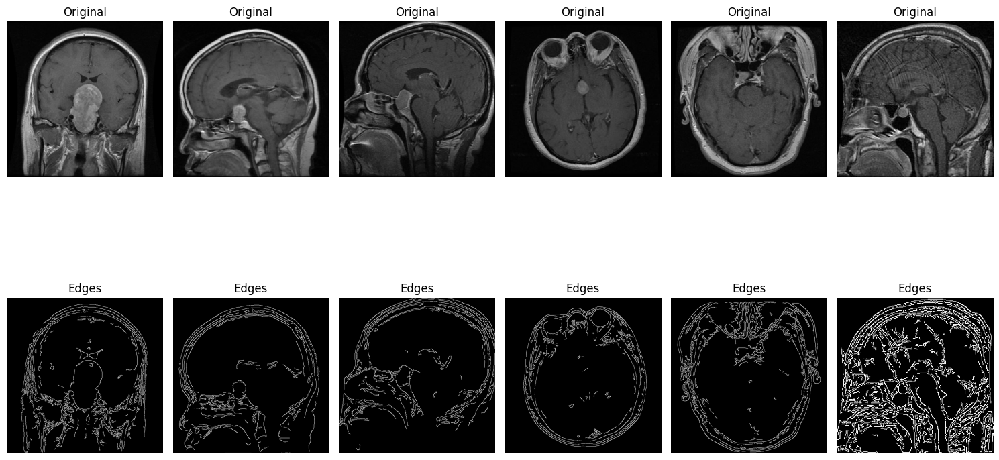

In [ ]:
def canny_edge_detection(image, threshold1, threshold2):
    edges = cv2.Canny(image, threshold1, threshold2)
    return edges

# Example usage:
edges = canny_edge_detection(image, 100, 200)
plt.figure(figsize=(15, 10))

# Display the grid of images
for i in range(6):
    plt.subplot(2, 6, i + 1)
    image_path = train_images.iloc[i]
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale

    # Plot the original image
    plt.imshow(image, cmap='gray')
    plt.title('Original')
    plt.axis('off')

    # Perform Canny edge detection on the image
    edges = canny_edge_detection(image, 100, 200)

    # Plot the edges
    plt.subplot(2, 6, i + 7)
    plt.imshow(edges, cmap='gray')
    plt.title('Edges')
    plt.axis('off')

plt.tight_layout()
plt.show()


Support Vector Machine (SVM)

In [ ]:
from tensorflow.keras.applications import VGG16
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# Load the pre-trained VGG16 model without the top (fully connected) layers
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Extract features using VGG16
train_features = vgg_model.predict(train_gen, verbose=1)
valid_features = vgg_model.predict(valid_gen, verbose=1)

# Flatten the features
train_features_flatten = train_features.reshape(train_features.shape[0], -1)
valid_features_flatten = valid_features.reshape(valid_features.shape[0], -1)

# Standardize features
scaler = StandardScaler()
train_features_scaled = scaler.fit_transform(train_features_flatten)
valid_features_scaled = scaler.transform(valid_features_flatten)

# Train SVM classifier
svm_classifier = SVC(kernel='linear')
svm_classifier.fit(train_features_scaled, train_gen.classes)

# Evaluate on validation data
predictions = svm_classifier.predict(valid_features_scaled)

# Classification report and confusion matrix
print(classification_report(valid_gen.classes, predictions))
conf_matrix = confusion_matrix(valid_gen.classes, predictions)


 92/357 [======>.......................] - ETA: 37:50

##  Building inception Model

In [ ]:
# Define the input shape
img_shape = (299, 299, 3)

# Load InceptionV3 as the base model
base_Model = InceptionV3(include_top=False, weights="imagenet",
                         input_shape=img_shape, pooling='max')

# Build the model
Model = Sequential([
    base_Model,
    Dropout(rate=0.5),
    Dense(128, activation='relu'),
    Dropout(rate=0.25),
    Dense(4, activation='softmax')
])

# Compile the model
Model.compile(Adamax(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display the model summary
Model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 516       
                                                                 
Total params: 22065572 (84.17 MB)
Trainable params: 22031140 (84.04 MB)
Non-trainable params: 34432 (134.50 KB)
_________________________________________________________________


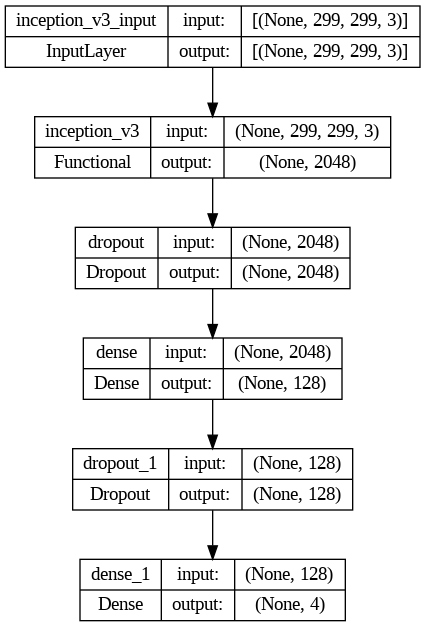

In [ ]:
plot_model(Model, show_shapes=True)

##  Training

In [ ]:
# Train the model
history = Model.fit(train_gen, epochs=2,
                    validation_data=valid_gen,
                    shuffle=False)


Epoch 1/2
357/357 [==============================] - 2710s 8s/step - loss: 0.5154 - accuracy: 0.8435 - val_loss: 0.2051 - val_accuracy: 0.9169
Epoch 2/2
357/357 [==============================] - 2708s 8s/step - loss: 0.1921 - accuracy: 0.9379 - val_loss: 0.1358 - val_accuracy: 0.9672


### Visualize model performance

In [ ]:
model_json = Model.to_json()

with open("model.json", "w") as json_file:
    json_file.write(model_json)

# serialize weights to HDF5
Model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

<Figure size 2000x800 with 0 Axes>

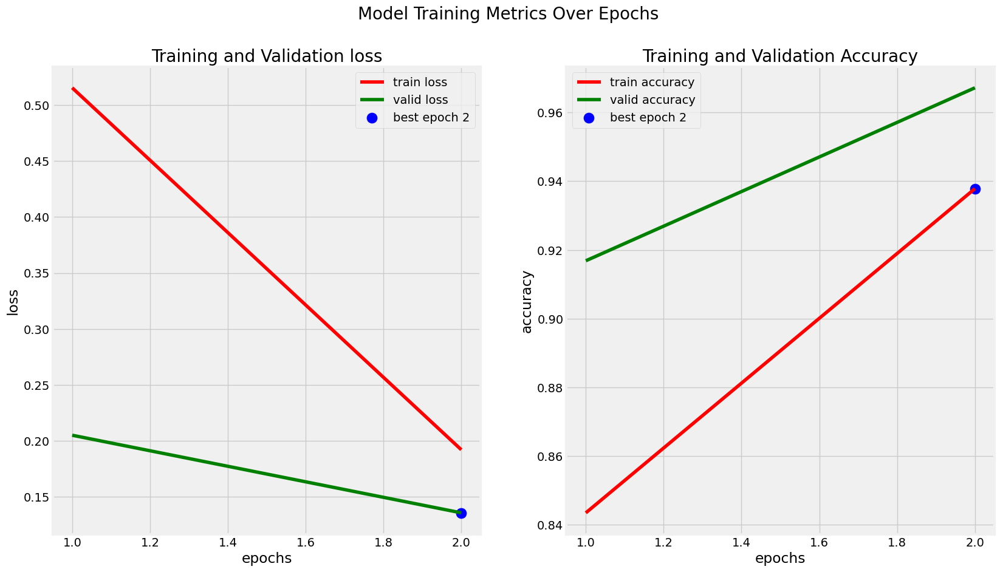

In [ ]:
plt.figure(figsize=(20, 8))
tr_loss=history.history["loss"]
val_loss=history.history["val_loss"]
index_loss=np.argmin(val_loss)
loss_lowest=val_loss[index_loss]
l_label=f"best epoch {index_loss+1}"

tr_accuracy=history.history["accuracy"]
val_accuracy=history.history["val_accuracy"]
index_acc=np.argmax(val_accuracy)
acc_highest=tr_accuracy[index_acc]
c_label=f"best epoch {index_acc+1}"

epochs=[i+1 for i in range (len(tr_accuracy))]


plt.figure(figsize=(20,10))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(epochs,tr_loss,"r",label="train loss")
plt.plot(epochs,val_loss,"g",label="valid loss")
plt.scatter(index_loss+1,loss_lowest,c="b",s=150,label=l_label)
plt.title('Training and Validation loss')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(epochs,tr_accuracy,"r",label="train accuracy")
plt.plot(epochs,val_accuracy,"g",label="valid accuracy")
plt.scatter(index_acc+1,acc_highest,c="b",s=150,label=c_label)
plt.title('Training and Validation Accuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()


plt.suptitle('Model Training Metrics Over Epochs', fontsize=20);

##  Evaluate model

In [ ]:
train_score=Model.evaluate(train_gen)
valid_score=Model.evaluate(valid_gen)
test_score=Model.evaluate(test_gen)

print(f"Train Loss : {train_score[0]:.3f}")
print(f"Train Accuracy : {train_score[1]*100:.2f}%")
print("-"*20)
print(f"Validation Loss : {valid_score[0]:.3f}")
print(f"Validation Accuracy : {valid_score[1]*100:.2f}%")
print("-"*20)
print(f"Test Loss: {test_score[0]:.3f}")
print(f"Test Accuracy: {test_score[1]*100:.2f}%")

82/82 [==============================] - 139s 2s/step - loss: 0.1358 - accuracy: 0.9672
Train Loss : 0.070
Train Accuracy : 97.93%
--------------------
Validation Loss : 0.136
Validation Accuracy : 96.72%
--------------------
Test Loss: 0.136
Test Accuracy: 96.72%


## Get Predictions

In [ ]:
preds=Model.predict(test_gen)
y_pred=np.argmax(preds,axis=1)

82/82 [==============================] - 160s 2s/step


### Confusion Matrics and Classification Report

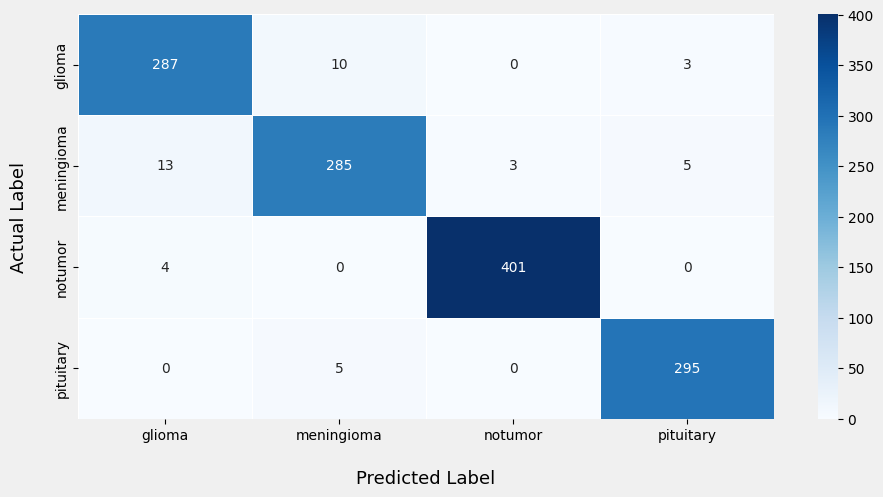

In [ ]:
plt.figure(figsize=(10,5))
plt.style.use('default')
cm=confusion_matrix(test_gen.classes,y_pred)
labels = list(test_gen.class_indices.keys())
sns.heatmap(cm,annot=True,fmt="d",xticklabels=labels,yticklabels=labels,cmap="Blues", linewidths=.5)
plt.xlabel('\nPredicted Label',fontsize=13)
plt.ylabel('Actual Label\n',fontsize=13);

In [ ]:
cr=classification_report(test_gen.classes,y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       300
           1       0.95      0.93      0.94       306
           2       0.99      0.99      0.99       405
           3       0.97      0.98      0.98       300

    accuracy                           0.97      1311
   macro avg       0.97      0.97      0.97      1311
weighted avg       0.97      0.97      0.97      1311



ROC

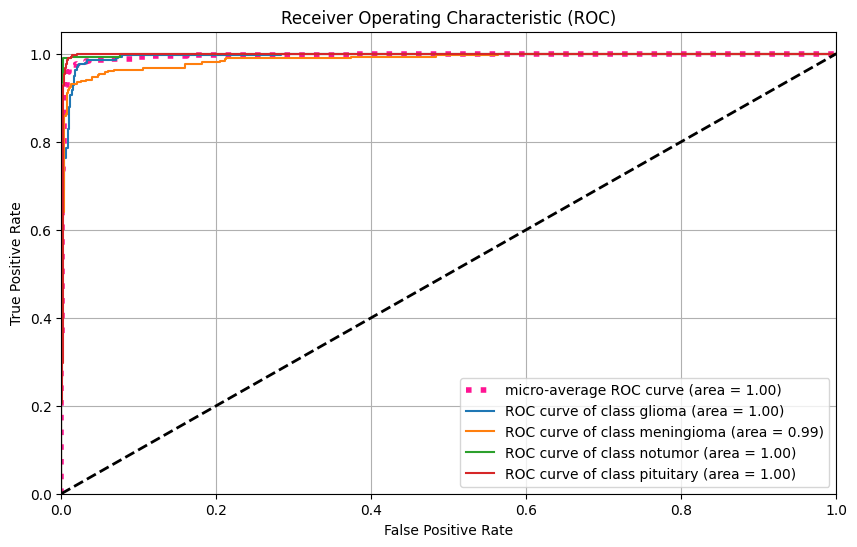

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Convert labels to binary format
y_test_binary = label_binarize(test_gen.classes, classes=[0, 1, 2, 3])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binary[:, i], preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_binary.ravel(), preds.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(classes[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()